Variational Auto-Encoders
=========================
This code implements a Variation Auto-Encoder (VAE). If using Google Colab, please activate the use of the GPU (Edit -> Notebok Settings).

In [ ]:
# install pytorch (http://pytorch.org/) if run from Google Colaboratory
import sys
if 'google.colab' in sys.modules and 'torch' not in sys.modules:
    !pip3 install torch torchvision --index-url https://download.pytorch.org/whl/cu118

if 'google.colab' in sys.modules and 'tqdm' not in sys.modules:
    !pip3 install tqdm


%matplotlib inline
import os
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from matplotlib import pyplot as plt
from matplotlib import gridspec

Looking in indexes: https://download.pytorch.org/whl/cu118


Hyper-Parameters
----------------

In [ ]:
batch_size = 128     # batch size UPDATED
latent_dim = 256     # latent-space dimension UPDATED
middle_dim = 512      # size of the middle layer UPDATED
learning_rate = 1e-4  # learning rate UPDATED
max_epochs = 250       # maximum number of epochs
use_gpu = True        # using the GPU

Loading the Dataset
-------------------
As in the GAN example, we will be using the MNIST dataset. MNIST images show digits from 0-9 in 28x28 grayscale images.

In [ ]:
# import torchvision.transforms as transforms
# from torch.utils.data import DataLoader

# import torch
# from torch import nn, optim, functional, utils
# from torch.utils.data.dataloader import DataLoader
# import torchvision
# from torchvision import datasets, utils
# from torchvision.datasets import CIFAR10
# import torchvision.transforms as transforms

# import time, os

# def get_cifar10_loader(batch_size=100, shuffle=True):
#     """
#     :return: train_loader, test_loader
#     """
#     norm_mean, norm_std = (0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)

#     # transformation of the training set
#     transform_train = transforms.Compose([
#             transforms.RandomCrop(32, padding=4),
#             transforms.RandomHorizontalFlip(),
#             transforms.ToTensor(),
#             transforms.Normalize(norm_mean, norm_std)])

#     # transformation of the validation set
#     transform_val = transforms.Compose([
#             transforms.ToTensor(),
#             transforms.Normalize(norm_mean, norm_std)])

#     train_dataset = CIFAR10(root='../data',
#                           train=True,
#                           transform=transform_train,
#                           download=True)

#     test_dataset = CIFAR10(root='../data',
#                          train=False,
#                          transform=transform_val,
#                          download=True)

#     train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
#                                                batch_size=batch_size,
#                                                shuffle=shuffle)
#     test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
#                                               batch_size=batch_size,
#                                               shuffle=shuffle)
#     return train_loader, test_loader


# train_dataloader, test_dataloader = get_cifar10_loader()

# # img_transform = transforms.ToTensor()

# # train_dataset = MNIST(root='./data/MNIST', download=True, train=True, transform=img_transform)
# # train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# # test_dataset = MNIST(root='./data/MNIST', download=True, train=False, transform=img_transform)
# # test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

# # image dimensions
# input_dim = 28**2




In [ ]:
# import torch
# from torchvision import datasets, transforms
# from torch.utils.data import DataLoader, Subset

# # Define image transformation
# img_transform = transforms.Compose([
#     transforms.ToTensor(),
#     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
# ])

# # CIFAR-10: load and transform data
# def load_cifar10_ships(train=True, batch_size=64):
#     dataset = datasets.CIFAR10(root='./data/CIFAR10', download=True, train=train, transform=img_transform)

#     # Filter for only the 'ship' images (label 8)
#     ship_indices = [i for i, (_, label) in enumerate(dataset) if label == 8]
#     ship_dataset = Subset(dataset, ship_indices)

#     dataloader = DataLoader(ship_dataset, batch_size=batch_size, shuffle=True)
#     return dataloader

# # Load training and test data
# train_dataloader = load_cifar10_ships(train=True, batch_size=batch_size)
# test_dataloader = load_cifar10_ships(train=False, batch_size=batch_size)


In [ ]:
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.utils.data

transform = transforms.Compose([
    transforms.ToTensor(),  # Converts to [0, 1] and maintains 3D shape
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Example normalization
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True, num_workers=2)


Files already downloaded and verified


In [ ]:
# Load CIFAR10 dataset
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Find indices of the 'ship' class (class index 8)
ship_indices = [i for i, (_, label) in enumerate(trainset) if label == 8]

# Create a subset for only the ship images
ship_subset = torch.utils.data.Subset(trainset, ship_indices)

# Create a DataLoader for the ship subset
trainloader = torch.utils.data.DataLoader(ship_subset, batch_size=64, shuffle=True, num_workers=2)

# # Load CIFAR10 dataset
# trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# # Filter out images of ships (class index 8 in CIFAR-10)
# ship_class_index = 8
# ship_images = [image for image, label in trainset if label == ship_class_index]

# # Create a DataLoader for the ship images
# ship_loader = torch.utils.data.DataLoader(ship_images, batch_size=64, shuffle=True)

Files already downloaded and verified


In [ ]:


# Function to unnormalize and display an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

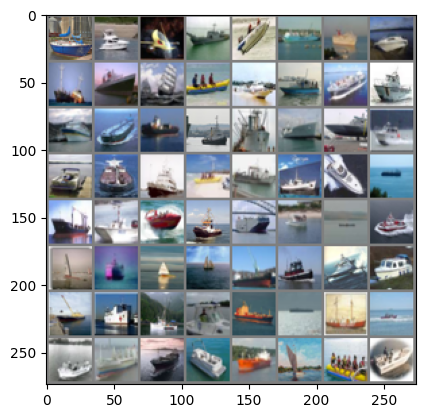

In [ ]:
# Get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# Show images
imshow(torchvision.utils.make_grid(images))

In [ ]:
input_dim = 28**2

VAE Definition
--------------
We will now use a specific scheme to initialize our weights, called Xavier initialization. You can neglect this if you are using other layers than fully connected.

In [ ]:
def init_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)

The following model represents the distribution encoder distribution q(z|x), together with the reparametrization trick.

In [ ]:

# class Q(nn.Module):
#     def __init__(self, channels, middle_dim, latent_dim):
#         super(Q, self).__init__()
#         # Convolutional layers
#         self.conv1 = nn.Conv2d(channels, 64, kernel_size=4, stride=2, padding=1) # Output: 64 x 16 x 16
#         self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1) # Output: 128 x 8 x 8
#         self.conv3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1) # Output: 256 x 4 x 4

#         # Fully connected layers for mean and variance
#         self.fc1 = nn.Linear(256*4*4, middle_dim)
#         self.fc_mu = nn.Linear(middle_dim, latent_dim)
#         self.fc_var = nn.Linear(middle_dim, latent_dim)

#     def forward(self, x):
#         x = F.relu(self.conv1(x))
#         x = F.relu(self.conv2(x))
#         x = F.relu(self.conv3(x))
#         x = x.view(x.size(0), -1) # Flatten the output for the fully connected layer
#         x = F.relu(self.fc1(x))
#         z_mu = self.fc_mu(x)
#         z_var = self.fc_var(x)
#         return z_mu, z_var

class Q(nn.Module):
    def __init__(self, channels, middle_dim, latent_dim):
        super(Q, self).__init__()
        # Convolutional layers with batch normalization
        self.conv1 = nn.Conv2d(channels, 64, kernel_size=4, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(256)

        # Fully connected layers for mean and variance
        self.fc1 = nn.Linear(256 * 4 * 4, middle_dim)
        self.fc_bn1 = nn.BatchNorm1d(middle_dim)
        self.fc_mu = nn.Linear(middle_dim, latent_dim)
        self.fc_var = nn.Linear(middle_dim, latent_dim)

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.conv1(x)))
        x = F.leaky_relu(self.bn2(self.conv2(x)))
        x = F.leaky_relu(self.bn3(self.conv3(x)))
        x = x.view(x.size(0), -1)  # Flatten the output for the fully connected layer
        x = F.leaky_relu(self.fc_bn1(self.fc1(x)))
        z_mu = self.fc_mu(x)
        z_var = self.fc_var(x)
        return z_mu, z_var


We now model the reparametrization trick.

In [ ]:
# class Reparametrization(nn.Module):
#   def __init__(self):
#     super(Reparametrization, self).__init__()

#   def forward(self, z_mu, z_var):
#     eps = torch.randn(z_var.size(0), z_var.size(1), device=device) # sample on a unit Gaussian
#     return z_mu + torch.exp(z_var/2) * eps

class Reparametrization(nn.Module):
    def __init__(self):
        super(Reparametrization, self).__init__()

    def forward(self, z_mu, z_var):
        eps = torch.randn(z_var.size(0), z_var.size(1), device=device)  # sample on a unit Gaussian
        z = z_mu + torch.exp(z_var / 2) * eps
        # print("Reparametrization output size:", z.size())  # Add this line to check the size
        return z


The following model represents the decoder P(x|z).

In [ ]:

# class P(nn.Module):
#     def __init__(self, latent_dim, output_channels):
#         super(P, self).__init__()
#         # Adjust middle_dim to match the size before reshaping
#         middle_dim = 256 * 4 * 4  # This should be 4096

#         # Fully connected layer to expand the latent dimension
#         self.fc = nn.Linear(latent_dim, middle_dim)

#         # Transposed convolutional layers
#         self.conv_trans1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
#         self.conv_trans2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
#         self.conv_trans3 = nn.ConvTranspose2d(64, output_channels, kernel_size=4, stride=2, padding=1)

#     def forward(self, x):
#         x = F.relu(self.fc(x))
#         x = x.view(x.size(0), 256, 4, 4)  # Reshape to a feature map
#         x = F.relu(self.conv_trans1(x))
#         x = F.relu(self.conv_trans2(x))
#         x = torch.sigmoid(self.conv_trans3(x))
#         return x


class P(nn.Module):
    def __init__(self, latent_dim, output_channels):
        super(P, self).__init__()
        middle_dim = 256 * 4 * 4  # Adjusted to match the size before reshaping

        # Fully connected layer to expand the latent dimension
        self.fc = nn.Linear(latent_dim, middle_dim)
        self.fc_bn = nn.BatchNorm1d(middle_dim)

        # Transposed convolutional layers with batch normalization
        self.conv_trans1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(128)
        self.conv_trans2 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv_trans3 = nn.ConvTranspose2d(64, output_channels, kernel_size=4, stride=2, padding=1)

    def forward(self, x):
        x = F.leaky_relu(self.fc_bn(self.fc(x)))
        x = x.view(x.size(0), 256, 4, 4)  # Reshape to a feature map
        x = F.leaky_relu(self.bn1(self.conv_trans1(x)))
        x = F.leaky_relu(self.bn2(self.conv_trans2(x)))
        x = torch.tanh(self.conv_trans3(x))  # Change to tanh if your input images are normalized to [-1, 1]
        return x



Training
--------

We first initialize an instance of the model and load it onto GPU if relevant.

In [ ]:
# creating instances of the model
# p = P(input_dim, middle_dim, latent_dim)
# q = Q(input_dim, middle_dim, latent_dim)
# p = P(latent_dim=latent_dim, middle_dim=middle_dim, output_channels=3)
# q = Q(input_dim=3072, middle_dim=middle_dim, latent_dim=latent_dim)
q = Q(channels=3, middle_dim=middle_dim, latent_dim=latent_dim)
# p = P(latent_dim=latent_dim, middle_dim=middle_dim, output_channels=3)
p = P(latent_dim=100, output_channels=3)



reparam = Reparametrization()

# loading them onto the GPU if relevant
if use_gpu and torch.cuda.is_available():
  device = torch.device("cuda:0")
  print("Using the GPU (faster).")
else:
  device = torch.device("cpu")
  print("Using the CPU.")

q = q.to(device)
p = p.to(device)
reparam = reparam.to(device)

# computing the number of parameters
num_params_gen = sum(param.numel() for param in p.parameters() if param.requires_grad)
num_params_disc = sum(param.numel() for param in q.parameters() if param.requires_grad)
print('Number of parameters for encoder: %d and decoder: %d' % (num_params_gen, num_params_disc))

Using the GPU (faster).
Number of parameters for encoder: 1080899 and decoder: 1760520


We can now do the training properly speaking.

Training...


Epoch 0: 100%|██████████| 79/79 [00:02<00:00, 31.53it/s]


	[Losses] Total 1.22e+03 - Recon. 1.18e+03 - KL 35.7


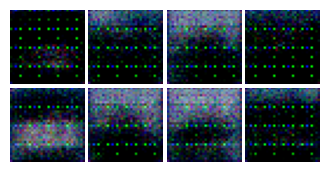

Epoch 1: 100%|██████████| 79/79 [00:01<00:00, 42.21it/s]


	[Losses] Total 6.3e+02 - Recon. 5.98e+02 - KL 32.5


Epoch 2: 100%|██████████| 79/79 [00:02<00:00, 30.70it/s]


	[Losses] Total 5.15e+02 - Recon. 4.76e+02 - KL 39.0


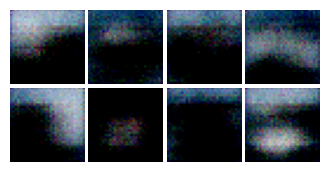

Epoch 3: 100%|██████████| 79/79 [00:02<00:00, 31.55it/s]


	[Losses] Total 4.69e+02 - Recon. 4.25e+02 - KL 43.9


Epoch 4: 100%|██████████| 79/79 [00:01<00:00, 40.69it/s]


	[Losses] Total 4.29e+02 - Recon. 3.82e+02 - KL 47.7


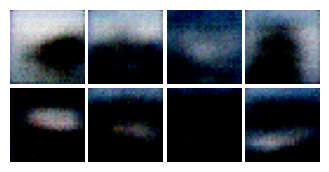

Epoch 5: 100%|██████████| 79/79 [00:02<00:00, 38.05it/s]


	[Losses] Total 4.31e+02 - Recon. 3.81e+02 - KL 50.4


Epoch 6: 100%|██████████| 79/79 [00:01<00:00, 40.28it/s]


	[Losses] Total 3.91e+02 - Recon. 3.37e+02 - KL 53.4


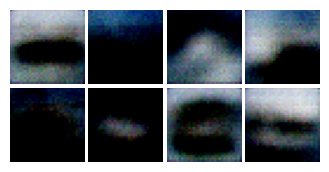

Epoch 7: 100%|██████████| 79/79 [00:01<00:00, 41.67it/s]


	[Losses] Total 3.94e+02 - Recon. 3.38e+02 - KL 55.8


Epoch 8: 100%|██████████| 79/79 [00:02<00:00, 30.04it/s]


	[Losses] Total 3.72e+02 - Recon. 3.14e+02 - KL 58.1


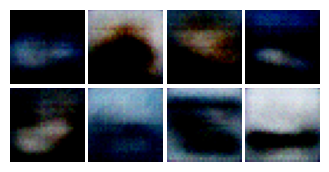

Epoch 9: 100%|██████████| 79/79 [00:02<00:00, 31.34it/s]


	[Losses] Total 3.63e+02 - Recon. 3.03e+02 - KL 60.4


Epoch 10: 100%|██████████| 79/79 [00:01<00:00, 39.84it/s]


	[Losses] Total 3.56e+02 - Recon. 2.95e+02 - KL 61.4


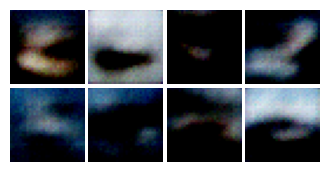

Epoch 11: 100%|██████████| 79/79 [00:01<00:00, 40.03it/s]


	[Losses] Total 3.53e+02 - Recon. 2.9e+02 - KL 62.3


Epoch 12: 100%|██████████| 79/79 [00:01<00:00, 40.28it/s]


	[Losses] Total 3.47e+02 - Recon. 2.84e+02 - KL 63.1


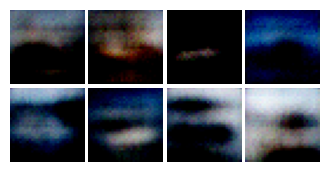

Epoch 13: 100%|██████████| 79/79 [00:01<00:00, 40.16it/s]


	[Losses] Total 3.43e+02 - Recon. 2.8e+02 - KL 63.2


Epoch 14: 100%|██████████| 79/79 [00:02<00:00, 29.13it/s]


	[Losses] Total 3.4e+02 - Recon. 2.76e+02 - KL 63.8


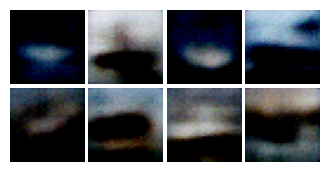

Epoch 15: 100%|██████████| 79/79 [00:02<00:00, 33.01it/s]


	[Losses] Total 3.34e+02 - Recon. 2.7e+02 - KL 64.0


Epoch 16: 100%|██████████| 79/79 [00:01<00:00, 41.20it/s]


	[Losses] Total 3.29e+02 - Recon. 2.65e+02 - KL 64.1


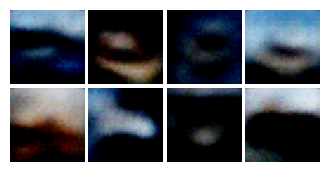

Epoch 17: 100%|██████████| 79/79 [00:01<00:00, 41.30it/s]


	[Losses] Total 3.28e+02 - Recon. 2.64e+02 - KL 64.2


Epoch 18: 100%|██████████| 79/79 [00:01<00:00, 39.59it/s]


	[Losses] Total 3.31e+02 - Recon. 2.67e+02 - KL 64.1


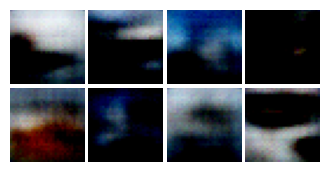

Epoch 19: 100%|██████████| 79/79 [00:01<00:00, 40.21it/s]


	[Losses] Total 3.22e+02 - Recon. 2.58e+02 - KL 64.2


Epoch 20: 100%|██████████| 79/79 [00:02<00:00, 29.99it/s]


	[Losses] Total 3.28e+02 - Recon. 2.63e+02 - KL 64.2


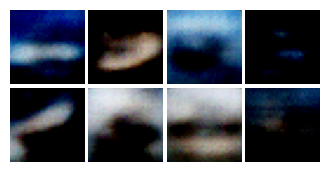

Epoch 21: 100%|██████████| 79/79 [00:02<00:00, 30.89it/s]


	[Losses] Total 3.15e+02 - Recon. 2.51e+02 - KL 64.4


Epoch 22: 100%|██████████| 79/79 [00:01<00:00, 41.26it/s]


	[Losses] Total 3.09e+02 - Recon. 2.45e+02 - KL 64.1


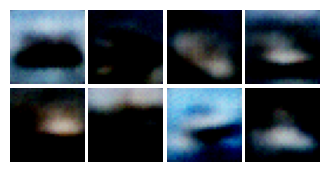

Epoch 23: 100%|██████████| 79/79 [00:01<00:00, 40.96it/s]


	[Losses] Total 3.14e+02 - Recon. 2.5e+02 - KL 63.9


Epoch 24: 100%|██████████| 79/79 [00:02<00:00, 39.45it/s]


	[Losses] Total 3.08e+02 - Recon. 2.45e+02 - KL 63.3


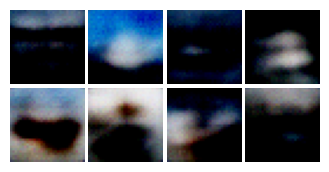

Epoch 25: 100%|██████████| 79/79 [00:01<00:00, 40.00it/s]


	[Losses] Total 3.07e+02 - Recon. 2.43e+02 - KL 63.3


Epoch 26: 100%|██████████| 79/79 [00:03<00:00, 25.13it/s]


	[Losses] Total 3.04e+02 - Recon. 2.41e+02 - KL 63.6


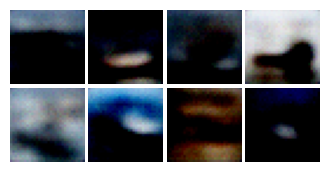

Epoch 27: 100%|██████████| 79/79 [00:02<00:00, 35.45it/s]


	[Losses] Total 3.04e+02 - Recon. 2.4e+02 - KL 63.2


Epoch 28: 100%|██████████| 79/79 [00:02<00:00, 38.88it/s]


	[Losses] Total 2.99e+02 - Recon. 2.36e+02 - KL 63.2


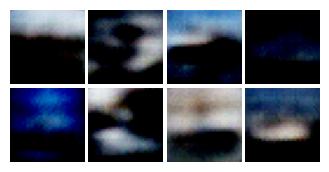

Epoch 29: 100%|██████████| 79/79 [00:01<00:00, 40.33it/s]


	[Losses] Total 3.04e+02 - Recon. 2.41e+02 - KL 63.0


Epoch 30: 100%|██████████| 79/79 [00:01<00:00, 39.64it/s]


	[Losses] Total 3.05e+02 - Recon. 2.42e+02 - KL 63.2


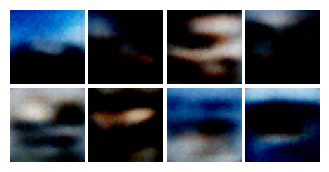

Epoch 31: 100%|██████████| 79/79 [00:02<00:00, 36.42it/s]


	[Losses] Total 3.05e+02 - Recon. 2.42e+02 - KL 63.0


Epoch 32: 100%|██████████| 79/79 [00:03<00:00, 24.02it/s]


	[Losses] Total 2.94e+02 - Recon. 2.31e+02 - KL 63.4


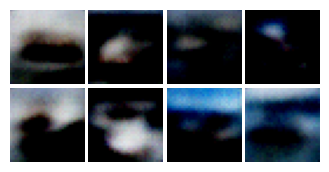

Epoch 33: 100%|██████████| 79/79 [00:03<00:00, 22.61it/s]


	[Losses] Total 2.9e+02 - Recon. 2.27e+02 - KL 62.6


Epoch 34: 100%|██████████| 79/79 [00:04<00:00, 17.43it/s]


	[Losses] Total 2.99e+02 - Recon. 2.36e+02 - KL 63.0


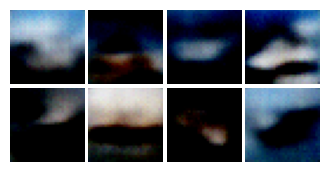

Epoch 35: 100%|██████████| 79/79 [00:04<00:00, 16.82it/s]


	[Losses] Total 2.9e+02 - Recon. 2.27e+02 - KL 63.0


Epoch 36: 100%|██████████| 79/79 [00:03<00:00, 21.17it/s]


	[Losses] Total 2.91e+02 - Recon. 2.28e+02 - KL 63.3


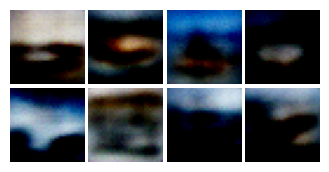

Epoch 37: 100%|██████████| 79/79 [00:02<00:00, 38.77it/s]


	[Losses] Total 2.97e+02 - Recon. 2.34e+02 - KL 62.9


Epoch 38: 100%|██████████| 79/79 [00:01<00:00, 39.82it/s]


	[Losses] Total 3.09e+02 - Recon. 2.46e+02 - KL 62.5


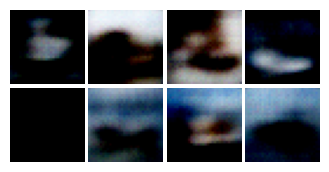

Epoch 39: 100%|██████████| 79/79 [00:02<00:00, 37.48it/s]


	[Losses] Total 2.83e+02 - Recon. 2.2e+02 - KL 62.9


Epoch 40: 100%|██████████| 79/79 [00:02<00:00, 26.78it/s]


	[Losses] Total 2.87e+02 - Recon. 2.24e+02 - KL 62.9


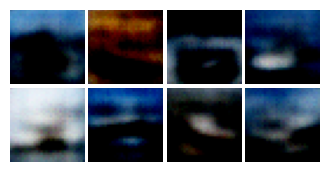

Epoch 41: 100%|██████████| 79/79 [00:02<00:00, 30.34it/s]


	[Losses] Total 2.82e+02 - Recon. 2.19e+02 - KL 62.7


Epoch 42: 100%|██████████| 79/79 [00:01<00:00, 39.74it/s]


	[Losses] Total 2.85e+02 - Recon. 2.23e+02 - KL 62.7


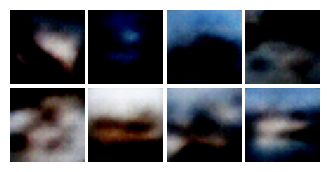

Epoch 43: 100%|██████████| 79/79 [00:02<00:00, 38.96it/s]


	[Losses] Total 2.78e+02 - Recon. 2.15e+02 - KL 62.6


Epoch 44: 100%|██████████| 79/79 [00:02<00:00, 38.95it/s]


	[Losses] Total 2.95e+02 - Recon. 2.32e+02 - KL 63.0


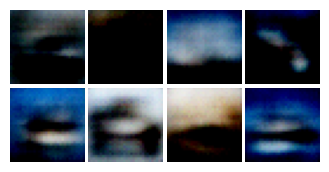

Epoch 45: 100%|██████████| 79/79 [00:02<00:00, 38.03it/s]


	[Losses] Total 2.85e+02 - Recon. 2.22e+02 - KL 62.5


Epoch 46: 100%|██████████| 79/79 [00:02<00:00, 26.96it/s]


	[Losses] Total 2.86e+02 - Recon. 2.23e+02 - KL 63.1


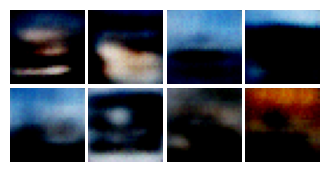

Epoch 47: 100%|██████████| 79/79 [00:02<00:00, 30.00it/s]


	[Losses] Total 2.84e+02 - Recon. 2.21e+02 - KL 63.0


Epoch 48: 100%|██████████| 79/79 [00:02<00:00, 37.50it/s]


	[Losses] Total 2.88e+02 - Recon. 2.25e+02 - KL 62.9


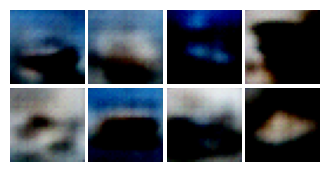

Epoch 49: 100%|██████████| 79/79 [00:02<00:00, 38.37it/s]


	[Losses] Total 2.76e+02 - Recon. 2.13e+02 - KL 62.8


Epoch 50: 100%|██████████| 79/79 [00:02<00:00, 38.89it/s]


	[Losses] Total 2.84e+02 - Recon. 2.22e+02 - KL 62.5


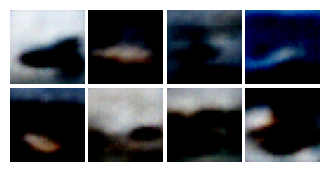

Epoch 51: 100%|██████████| 79/79 [00:02<00:00, 37.44it/s]


	[Losses] Total 2.86e+02 - Recon. 2.23e+02 - KL 62.7


Epoch 52: 100%|██████████| 79/79 [00:02<00:00, 27.14it/s]


	[Losses] Total 2.72e+02 - Recon. 2.09e+02 - KL 62.8


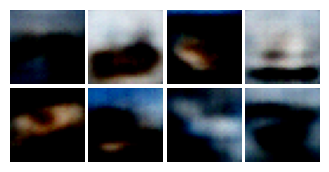

Epoch 53: 100%|██████████| 79/79 [00:02<00:00, 28.55it/s]


	[Losses] Total 2.82e+02 - Recon. 2.19e+02 - KL 62.6


Epoch 54: 100%|██████████| 79/79 [00:02<00:00, 38.48it/s]


	[Losses] Total 2.79e+02 - Recon. 2.17e+02 - KL 62.7


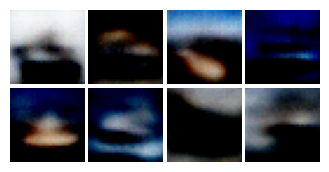

Epoch 55: 100%|██████████| 79/79 [00:02<00:00, 39.11it/s]


	[Losses] Total 2.73e+02 - Recon. 2.1e+02 - KL 62.9


Epoch 56: 100%|██████████| 79/79 [00:02<00:00, 38.37it/s]


	[Losses] Total 2.8e+02 - Recon. 2.16e+02 - KL 63.1


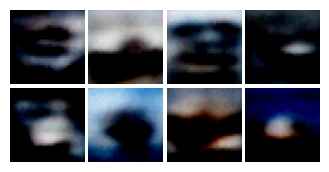

Epoch 57: 100%|██████████| 79/79 [00:02<00:00, 36.42it/s]


	[Losses] Total 2.75e+02 - Recon. 2.12e+02 - KL 63.0


Epoch 58: 100%|██████████| 79/79 [00:03<00:00, 25.56it/s]


	[Losses] Total 2.68e+02 - Recon. 2.05e+02 - KL 63.2


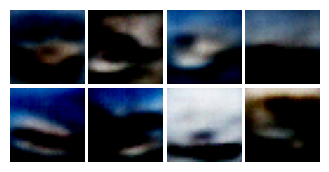

Epoch 59: 100%|██████████| 79/79 [00:02<00:00, 30.18it/s]


	[Losses] Total 2.73e+02 - Recon. 2.1e+02 - KL 63.0


Epoch 60: 100%|██████████| 79/79 [00:02<00:00, 37.11it/s]


	[Losses] Total 2.78e+02 - Recon. 2.15e+02 - KL 63.1


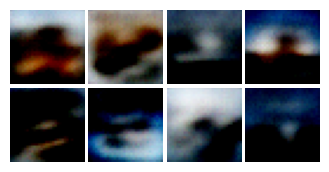

Epoch 61: 100%|██████████| 79/79 [00:02<00:00, 37.19it/s]


	[Losses] Total 2.81e+02 - Recon. 2.18e+02 - KL 63.0


Epoch 62: 100%|██████████| 79/79 [00:02<00:00, 34.34it/s]


	[Losses] Total 2.75e+02 - Recon. 2.12e+02 - KL 63.0


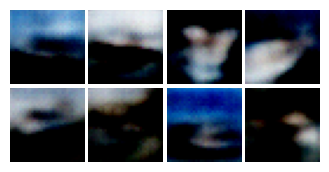

Epoch 63: 100%|██████████| 79/79 [00:02<00:00, 31.01it/s]


	[Losses] Total 2.63e+02 - Recon. 2e+02 - KL 62.8


Epoch 64: 100%|██████████| 79/79 [00:02<00:00, 26.66it/s]


	[Losses] Total 2.64e+02 - Recon. 2.02e+02 - KL 62.8


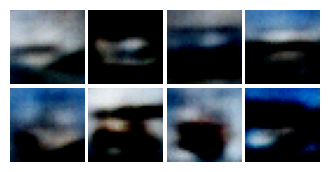

Epoch 65: 100%|██████████| 79/79 [00:03<00:00, 23.55it/s]


	[Losses] Total 2.75e+02 - Recon. 2.12e+02 - KL 63.0


Epoch 66: 100%|██████████| 79/79 [00:02<00:00, 36.56it/s]


	[Losses] Total 2.59e+02 - Recon. 1.97e+02 - KL 62.8


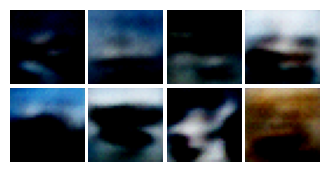

Epoch 67: 100%|██████████| 79/79 [00:02<00:00, 34.99it/s]


	[Losses] Total 2.68e+02 - Recon. 2.05e+02 - KL 62.8


Epoch 68: 100%|██████████| 79/79 [00:02<00:00, 34.76it/s]


	[Losses] Total 2.65e+02 - Recon. 2.02e+02 - KL 63.0


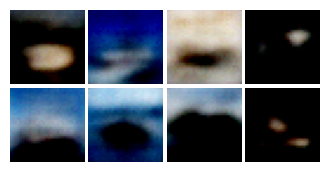

Epoch 69: 100%|██████████| 79/79 [00:02<00:00, 26.37it/s]


	[Losses] Total 2.72e+02 - Recon. 2.09e+02 - KL 63.2


Epoch 70: 100%|██████████| 79/79 [00:02<00:00, 28.35it/s]


	[Losses] Total 2.78e+02 - Recon. 2.14e+02 - KL 63.3


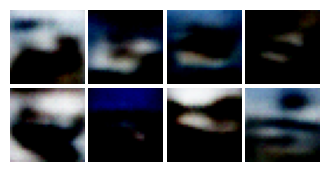

Epoch 71: 100%|██████████| 79/79 [00:02<00:00, 35.36it/s]


	[Losses] Total 2.73e+02 - Recon. 2.1e+02 - KL 63.3


Epoch 72: 100%|██████████| 79/79 [00:02<00:00, 36.79it/s]


	[Losses] Total 2.67e+02 - Recon. 2.04e+02 - KL 63.2


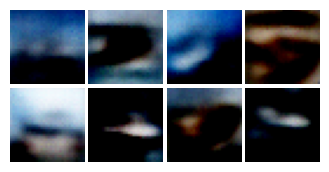

Epoch 73: 100%|██████████| 79/79 [00:02<00:00, 35.27it/s]


	[Losses] Total 2.64e+02 - Recon. 2.01e+02 - KL 63.0


Epoch 74: 100%|██████████| 79/79 [00:02<00:00, 31.36it/s]


	[Losses] Total 2.6e+02 - Recon. 1.97e+02 - KL 63.3


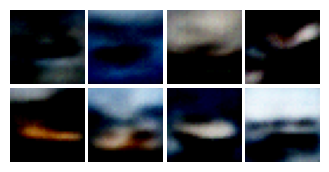

Epoch 75: 100%|██████████| 79/79 [00:03<00:00, 25.30it/s]


	[Losses] Total 2.59e+02 - Recon. 1.96e+02 - KL 63.5


Epoch 76: 100%|██████████| 79/79 [00:02<00:00, 30.92it/s]


	[Losses] Total 2.62e+02 - Recon. 1.98e+02 - KL 63.6


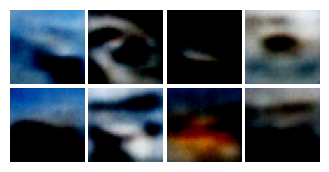

Epoch 77: 100%|██████████| 79/79 [00:02<00:00, 35.12it/s]


	[Losses] Total 2.56e+02 - Recon. 1.93e+02 - KL 63.4


Epoch 78: 100%|██████████| 79/79 [00:02<00:00, 33.85it/s]


	[Losses] Total 2.57e+02 - Recon. 1.94e+02 - KL 63.4


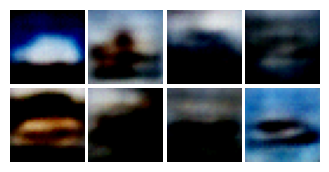

Epoch 79: 100%|██████████| 79/79 [00:02<00:00, 36.02it/s]


	[Losses] Total 2.65e+02 - Recon. 2.01e+02 - KL 63.6


Epoch 80: 100%|██████████| 79/79 [00:02<00:00, 27.82it/s]


	[Losses] Total 2.57e+02 - Recon. 1.93e+02 - KL 63.8


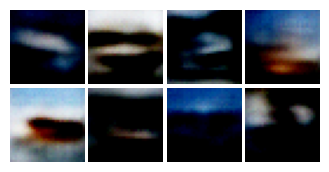

Epoch 81: 100%|██████████| 79/79 [00:02<00:00, 26.79it/s]


	[Losses] Total 2.87e+02 - Recon. 2.24e+02 - KL 63.5


Epoch 82: 100%|██████████| 79/79 [00:02<00:00, 35.95it/s]


	[Losses] Total 2.62e+02 - Recon. 1.98e+02 - KL 64.1


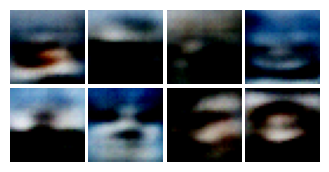

Epoch 83: 100%|██████████| 79/79 [00:02<00:00, 36.14it/s]


	[Losses] Total 2.62e+02 - Recon. 1.99e+02 - KL 63.6


Epoch 84: 100%|██████████| 79/79 [00:02<00:00, 35.07it/s]


	[Losses] Total 2.6e+02 - Recon. 1.96e+02 - KL 64.2


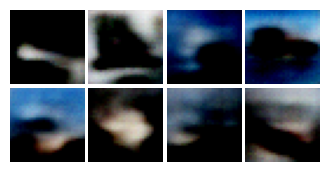

Epoch 85: 100%|██████████| 79/79 [00:02<00:00, 31.20it/s]


	[Losses] Total 2.62e+02 - Recon. 1.99e+02 - KL 63.7


Epoch 86: 100%|██████████| 79/79 [00:03<00:00, 23.96it/s]


	[Losses] Total 2.54e+02 - Recon. 1.9e+02 - KL 63.8


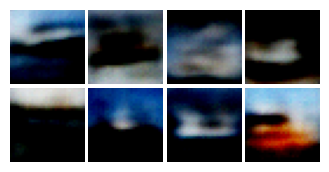

Epoch 87: 100%|██████████| 79/79 [00:02<00:00, 30.05it/s]


	[Losses] Total 2.59e+02 - Recon. 1.95e+02 - KL 64.0


Epoch 88: 100%|██████████| 79/79 [00:02<00:00, 33.31it/s]


	[Losses] Total 2.63e+02 - Recon. 1.99e+02 - KL 64.1


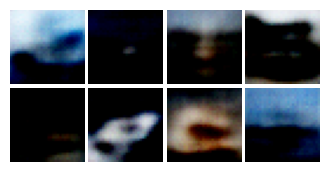

Epoch 89: 100%|██████████| 79/79 [00:02<00:00, 35.07it/s]


	[Losses] Total 2.49e+02 - Recon. 1.85e+02 - KL 64.0


Epoch 90: 100%|██████████| 79/79 [00:02<00:00, 33.92it/s]


	[Losses] Total 2.52e+02 - Recon. 1.88e+02 - KL 63.9


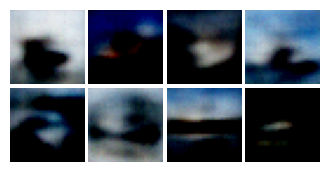

Epoch 91: 100%|██████████| 79/79 [00:03<00:00, 25.48it/s]


	[Losses] Total 2.52e+02 - Recon. 1.88e+02 - KL 64.3


Epoch 92: 100%|██████████| 79/79 [00:03<00:00, 24.87it/s]


	[Losses] Total 2.69e+02 - Recon. 2.05e+02 - KL 64.4


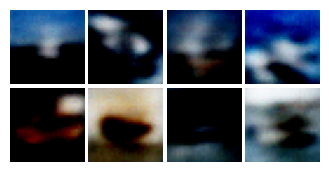

Epoch 93: 100%|██████████| 79/79 [00:02<00:00, 33.64it/s]


	[Losses] Total 2.52e+02 - Recon. 1.87e+02 - KL 64.3


Epoch 94: 100%|██████████| 79/79 [00:02<00:00, 33.79it/s]


	[Losses] Total 2.56e+02 - Recon. 1.92e+02 - KL 64.1


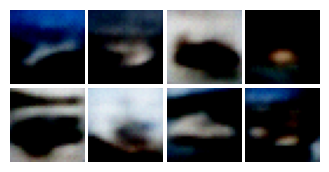

Epoch 95: 100%|██████████| 79/79 [00:02<00:00, 32.95it/s]


	[Losses] Total 2.59e+02 - Recon. 1.95e+02 - KL 64.2


Epoch 96: 100%|██████████| 79/79 [00:02<00:00, 29.85it/s]


	[Losses] Total 2.52e+02 - Recon. 1.88e+02 - KL 64.1


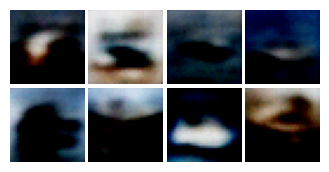

Epoch 97: 100%|██████████| 79/79 [00:03<00:00, 24.55it/s]


	[Losses] Total 2.53e+02 - Recon. 1.89e+02 - KL 64.2


Epoch 98: 100%|██████████| 79/79 [00:02<00:00, 28.39it/s]


	[Losses] Total 2.5e+02 - Recon. 1.86e+02 - KL 64.2


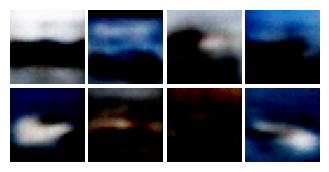

Epoch 99: 100%|██████████| 79/79 [00:02<00:00, 33.18it/s]


	[Losses] Total 2.61e+02 - Recon. 1.97e+02 - KL 64.4


Epoch 100: 100%|██████████| 79/79 [00:02<00:00, 33.75it/s]


	[Losses] Total 2.66e+02 - Recon. 2.02e+02 - KL 64.0


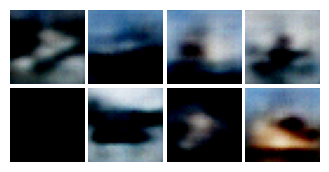

Epoch 101: 100%|██████████| 79/79 [00:02<00:00, 32.94it/s]


	[Losses] Total 2.57e+02 - Recon. 1.92e+02 - KL 64.8


Epoch 102: 100%|██████████| 79/79 [00:02<00:00, 26.45it/s]


	[Losses] Total 2.46e+02 - Recon. 1.81e+02 - KL 64.7


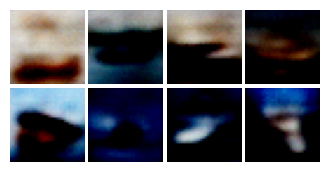

Epoch 103: 100%|██████████| 79/79 [00:03<00:00, 24.47it/s]


	[Losses] Total 2.56e+02 - Recon. 1.92e+02 - KL 64.6


Epoch 104: 100%|██████████| 79/79 [00:02<00:00, 32.93it/s]


	[Losses] Total 2.59e+02 - Recon. 1.95e+02 - KL 64.6


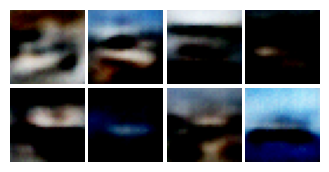

Epoch 105: 100%|██████████| 79/79 [00:02<00:00, 31.36it/s]


	[Losses] Total 2.53e+02 - Recon. 1.89e+02 - KL 64.6


Epoch 106: 100%|██████████| 79/79 [00:02<00:00, 31.56it/s]


	[Losses] Total 2.53e+02 - Recon. 1.89e+02 - KL 64.6


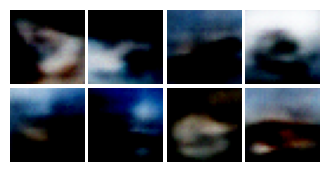

Epoch 107: 100%|██████████| 79/79 [00:02<00:00, 27.97it/s]


	[Losses] Total 2.47e+02 - Recon. 1.82e+02 - KL 64.5


Epoch 108: 100%|██████████| 79/79 [00:03<00:00, 24.60it/s]


	[Losses] Total 2.52e+02 - Recon. 1.87e+02 - KL 64.4


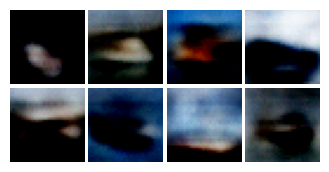

Epoch 109: 100%|██████████| 79/79 [00:02<00:00, 26.63it/s]


	[Losses] Total 2.48e+02 - Recon. 1.83e+02 - KL 64.8


Epoch 110: 100%|██████████| 79/79 [00:02<00:00, 32.56it/s]


	[Losses] Total 2.44e+02 - Recon. 1.79e+02 - KL 64.8


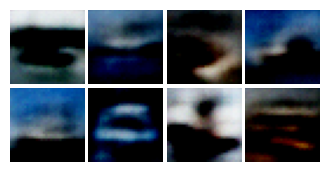

Epoch 111: 100%|██████████| 79/79 [00:02<00:00, 32.14it/s]


	[Losses] Total 2.6e+02 - Recon. 1.95e+02 - KL 64.6


Epoch 112: 100%|██████████| 79/79 [00:02<00:00, 32.68it/s]


	[Losses] Total 2.43e+02 - Recon. 1.78e+02 - KL 64.6


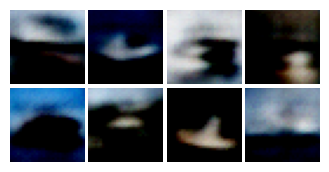

Epoch 113: 100%|██████████| 79/79 [00:03<00:00, 23.83it/s]


	[Losses] Total 2.49e+02 - Recon. 1.84e+02 - KL 65.0


Epoch 114: 100%|██████████| 79/79 [00:03<00:00, 24.47it/s]


	[Losses] Total 2.47e+02 - Recon. 1.82e+02 - KL 65.0


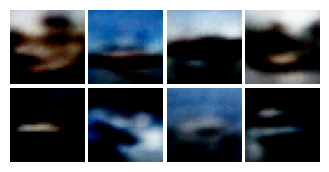

Epoch 115: 100%|██████████| 79/79 [00:02<00:00, 30.69it/s]


	[Losses] Total 2.53e+02 - Recon. 1.88e+02 - KL 65.0


Epoch 116: 100%|██████████| 79/79 [00:02<00:00, 32.79it/s]


	[Losses] Total 2.47e+02 - Recon. 1.82e+02 - KL 64.6


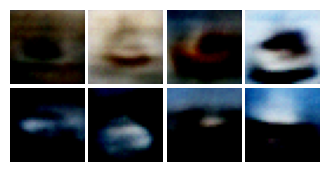

Epoch 117: 100%|██████████| 79/79 [00:02<00:00, 32.33it/s]


	[Losses] Total 2.49e+02 - Recon. 1.84e+02 - KL 65.0


Epoch 118: 100%|██████████| 79/79 [00:02<00:00, 27.67it/s]


	[Losses] Total 2.49e+02 - Recon. 1.84e+02 - KL 64.9


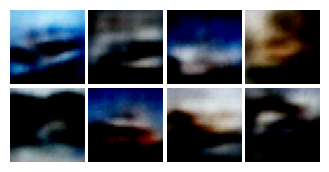

Epoch 119: 100%|██████████| 79/79 [00:03<00:00, 23.82it/s]


	[Losses] Total 2.47e+02 - Recon. 1.82e+02 - KL 64.9


Epoch 120: 100%|██████████| 79/79 [00:02<00:00, 27.62it/s]


	[Losses] Total 2.47e+02 - Recon. 1.82e+02 - KL 64.9


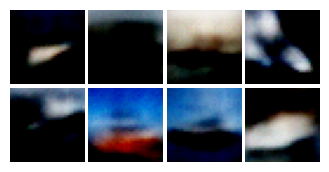

Epoch 121: 100%|██████████| 79/79 [00:02<00:00, 31.42it/s]


	[Losses] Total 2.47e+02 - Recon. 1.82e+02 - KL 65.0


Epoch 122: 100%|██████████| 79/79 [00:02<00:00, 31.46it/s]


	[Losses] Total 2.59e+02 - Recon. 1.94e+02 - KL 64.9


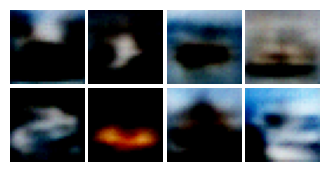

Epoch 123: 100%|██████████| 79/79 [00:02<00:00, 29.33it/s]


	[Losses] Total 2.46e+02 - Recon. 1.81e+02 - KL 65.2


Epoch 124: 100%|██████████| 79/79 [00:03<00:00, 24.25it/s]


	[Losses] Total 2.55e+02 - Recon. 1.89e+02 - KL 65.2


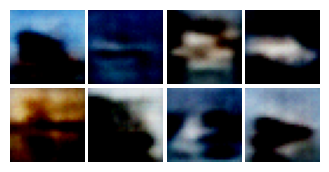

Epoch 125: 100%|██████████| 79/79 [00:03<00:00, 25.72it/s]


	[Losses] Total 2.51e+02 - Recon. 1.86e+02 - KL 65.1


Epoch 126: 100%|██████████| 79/79 [00:02<00:00, 30.47it/s]


	[Losses] Total 2.45e+02 - Recon. 1.8e+02 - KL 65.3


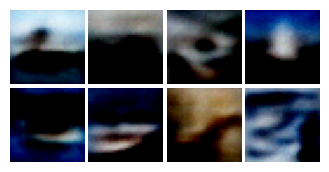

Epoch 127: 100%|██████████| 79/79 [00:02<00:00, 30.94it/s]


	[Losses] Total 2.44e+02 - Recon. 1.79e+02 - KL 65.2


Epoch 128: 100%|██████████| 79/79 [00:02<00:00, 31.73it/s]


	[Losses] Total 2.44e+02 - Recon. 1.79e+02 - KL 65.4


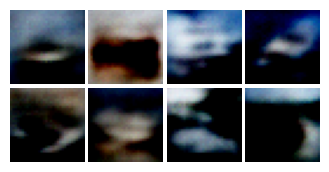

Epoch 129: 100%|██████████| 79/79 [00:03<00:00, 24.16it/s]


	[Losses] Total 2.55e+02 - Recon. 1.89e+02 - KL 65.4


Epoch 130: 100%|██████████| 79/79 [00:03<00:00, 23.70it/s]


	[Losses] Total 2.47e+02 - Recon. 1.81e+02 - KL 65.2


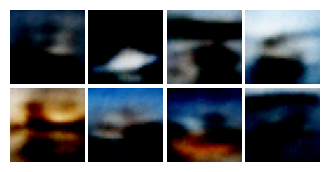

Epoch 131: 100%|██████████| 79/79 [00:02<00:00, 28.61it/s]


	[Losses] Total 2.44e+02 - Recon. 1.79e+02 - KL 65.0


Epoch 132: 100%|██████████| 79/79 [00:02<00:00, 31.96it/s]


	[Losses] Total 2.44e+02 - Recon. 1.78e+02 - KL 65.5


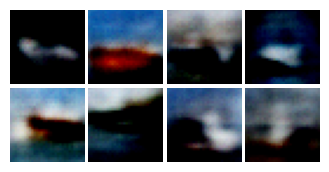

Epoch 133: 100%|██████████| 79/79 [00:02<00:00, 31.05it/s]


	[Losses] Total 2.44e+02 - Recon. 1.78e+02 - KL 65.2


Epoch 134: 100%|██████████| 79/79 [00:02<00:00, 26.74it/s]


	[Losses] Total 2.49e+02 - Recon. 1.83e+02 - KL 65.3


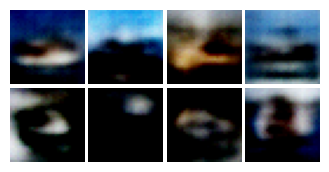

Epoch 135: 100%|██████████| 79/79 [00:03<00:00, 24.05it/s]


	[Losses] Total 2.47e+02 - Recon. 1.81e+02 - KL 65.7


Epoch 136: 100%|██████████| 79/79 [00:02<00:00, 26.47it/s]


	[Losses] Total 2.42e+02 - Recon. 1.77e+02 - KL 65.4


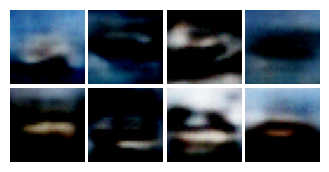

Epoch 137: 100%|██████████| 79/79 [00:02<00:00, 28.00it/s]


	[Losses] Total 2.46e+02 - Recon. 1.81e+02 - KL 65.1


Epoch 138: 100%|██████████| 79/79 [00:02<00:00, 30.35it/s]


	[Losses] Total 2.5e+02 - Recon. 1.84e+02 - KL 65.7


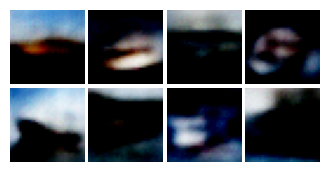

Epoch 139: 100%|██████████| 79/79 [00:03<00:00, 25.38it/s]


	[Losses] Total 2.57e+02 - Recon. 1.91e+02 - KL 65.5


Epoch 140: 100%|██████████| 79/79 [00:03<00:00, 24.24it/s]


	[Losses] Total 2.39e+02 - Recon. 1.74e+02 - KL 65.5


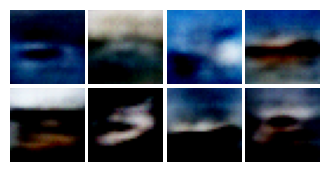

Epoch 141: 100%|██████████| 79/79 [00:03<00:00, 25.68it/s]


	[Losses] Total 2.43e+02 - Recon. 1.77e+02 - KL 65.7


Epoch 142: 100%|██████████| 79/79 [00:02<00:00, 27.95it/s]


	[Losses] Total 2.47e+02 - Recon. 1.81e+02 - KL 65.4


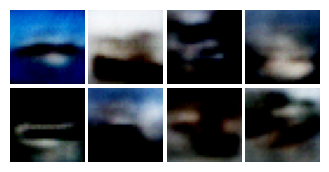

Epoch 143: 100%|██████████| 79/79 [00:02<00:00, 29.46it/s]


	[Losses] Total 2.49e+02 - Recon. 1.83e+02 - KL 65.8


Epoch 144: 100%|██████████| 79/79 [00:02<00:00, 28.58it/s]


	[Losses] Total 2.45e+02 - Recon. 1.8e+02 - KL 65.5


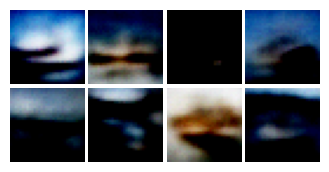

Epoch 145: 100%|██████████| 79/79 [00:03<00:00, 24.42it/s]


	[Losses] Total 2.51e+02 - Recon. 1.85e+02 - KL 65.4


Epoch 146: 100%|██████████| 79/79 [00:03<00:00, 25.01it/s]


	[Losses] Total 2.4e+02 - Recon. 1.74e+02 - KL 65.7


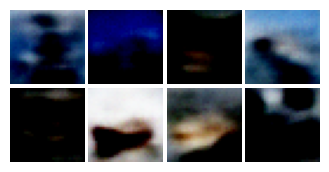

Epoch 147: 100%|██████████| 79/79 [00:03<00:00, 25.65it/s]


	[Losses] Total 2.49e+02 - Recon. 1.83e+02 - KL 65.9


Epoch 148: 100%|██████████| 79/79 [00:02<00:00, 30.90it/s]


	[Losses] Total 2.42e+02 - Recon. 1.76e+02 - KL 65.9


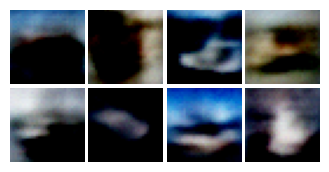

Epoch 149: 100%|██████████| 79/79 [00:03<00:00, 25.83it/s]


	[Losses] Total 2.39e+02 - Recon. 1.73e+02 - KL 65.7


Epoch 150: 100%|██████████| 79/79 [00:03<00:00, 24.09it/s]


	[Losses] Total 2.42e+02 - Recon. 1.76e+02 - KL 65.9


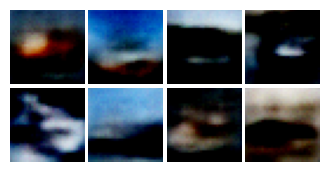

Epoch 151: 100%|██████████| 79/79 [00:03<00:00, 24.69it/s]


	[Losses] Total 2.48e+02 - Recon. 1.82e+02 - KL 66.0


Epoch 152: 100%|██████████| 79/79 [00:02<00:00, 28.51it/s]


	[Losses] Total 2.41e+02 - Recon. 1.76e+02 - KL 65.7


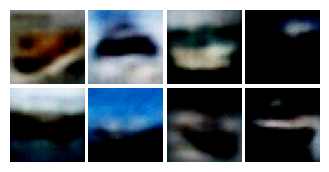

Epoch 153: 100%|██████████| 79/79 [00:02<00:00, 29.74it/s]


	[Losses] Total 2.41e+02 - Recon. 1.75e+02 - KL 65.9


Epoch 154: 100%|██████████| 79/79 [00:02<00:00, 26.76it/s]


	[Losses] Total 2.42e+02 - Recon. 1.76e+02 - KL 65.9


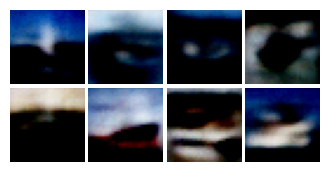

Epoch 155: 100%|██████████| 79/79 [00:03<00:00, 23.85it/s]


	[Losses] Total 2.34e+02 - Recon. 1.68e+02 - KL 65.7


Epoch 156: 100%|██████████| 79/79 [00:03<00:00, 25.38it/s]


	[Losses] Total 2.36e+02 - Recon. 1.7e+02 - KL 65.9


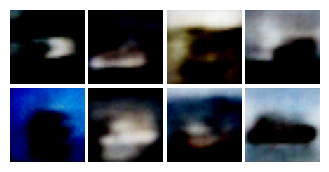

Epoch 157: 100%|██████████| 79/79 [00:02<00:00, 26.58it/s]


	[Losses] Total 2.7e+02 - Recon. 2.04e+02 - KL 66.2


Epoch 158: 100%|██████████| 79/79 [00:02<00:00, 29.45it/s]


	[Losses] Total 2.39e+02 - Recon. 1.72e+02 - KL 66.2


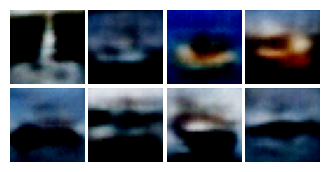

Epoch 159: 100%|██████████| 79/79 [00:02<00:00, 27.70it/s]


	[Losses] Total 2.37e+02 - Recon. 1.71e+02 - KL 65.9


Epoch 160: 100%|██████████| 79/79 [00:03<00:00, 25.86it/s]


	[Losses] Total 2.41e+02 - Recon. 1.74e+02 - KL 66.6


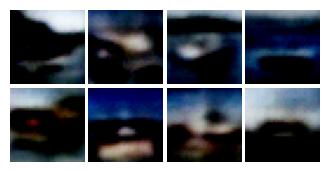

Epoch 161: 100%|██████████| 79/79 [00:03<00:00, 24.94it/s]


	[Losses] Total 2.44e+02 - Recon. 1.77e+02 - KL 66.2


Epoch 162: 100%|██████████| 79/79 [00:02<00:00, 27.10it/s]


	[Losses] Total 2.39e+02 - Recon. 1.73e+02 - KL 66.4


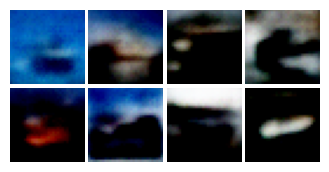

Epoch 163: 100%|██████████| 79/79 [00:03<00:00, 26.18it/s]


	[Losses] Total 2.42e+02 - Recon. 1.76e+02 - KL 66.2


Epoch 164: 100%|██████████| 79/79 [00:02<00:00, 27.81it/s]


	[Losses] Total 2.39e+02 - Recon. 1.73e+02 - KL 65.9


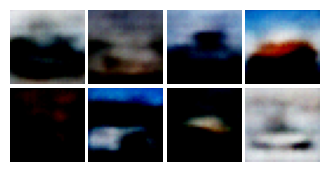

Epoch 165: 100%|██████████| 79/79 [00:03<00:00, 24.60it/s]


	[Losses] Total 2.37e+02 - Recon. 1.71e+02 - KL 66.3


Epoch 166: 100%|██████████| 79/79 [00:03<00:00, 24.18it/s]


	[Losses] Total 2.32e+02 - Recon. 1.66e+02 - KL 65.8


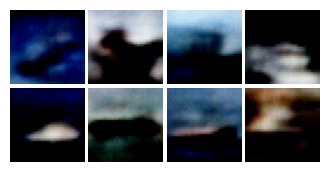

Epoch 167: 100%|██████████| 79/79 [00:03<00:00, 25.81it/s]


	[Losses] Total 2.43e+02 - Recon. 1.76e+02 - KL 66.4


Epoch 168: 100%|██████████| 79/79 [00:02<00:00, 27.03it/s]


	[Losses] Total 2.37e+02 - Recon. 1.71e+02 - KL 66.5


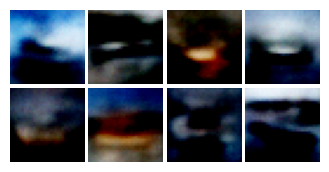

Epoch 169: 100%|██████████| 79/79 [00:03<00:00, 26.00it/s]


	[Losses] Total 2.42e+02 - Recon. 1.76e+02 - KL 66.5


Epoch 170: 100%|██████████| 79/79 [00:03<00:00, 24.66it/s]


	[Losses] Total 2.51e+02 - Recon. 1.85e+02 - KL 66.5


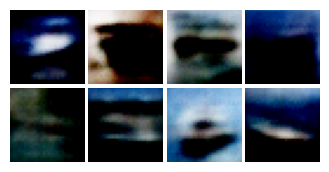

Epoch 171: 100%|██████████| 79/79 [00:02<00:00, 26.78it/s]


	[Losses] Total 2.36e+02 - Recon. 1.7e+02 - KL 66.3


Epoch 172: 100%|██████████| 79/79 [00:02<00:00, 26.57it/s]


	[Losses] Total 2.4e+02 - Recon. 1.74e+02 - KL 66.3


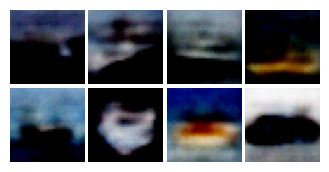

Epoch 173: 100%|██████████| 79/79 [00:03<00:00, 25.59it/s]


	[Losses] Total 2.34e+02 - Recon. 1.68e+02 - KL 66.3


Epoch 174: 100%|██████████| 79/79 [00:03<00:00, 24.45it/s]


	[Losses] Total 2.4e+02 - Recon. 1.73e+02 - KL 66.5


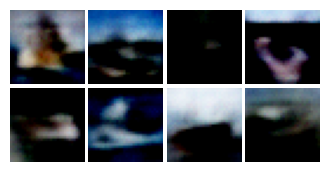

Epoch 175: 100%|██████████| 79/79 [00:03<00:00, 23.52it/s]


	[Losses] Total 2.49e+02 - Recon. 1.83e+02 - KL 66.5


Epoch 176: 100%|██████████| 79/79 [00:03<00:00, 24.27it/s]


	[Losses] Total 2.44e+02 - Recon. 1.77e+02 - KL 66.9


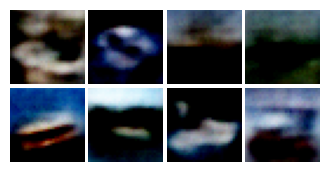

Epoch 177: 100%|██████████| 79/79 [00:02<00:00, 26.56it/s]


	[Losses] Total 2.38e+02 - Recon. 1.71e+02 - KL 66.7


Epoch 178: 100%|██████████| 79/79 [00:03<00:00, 26.16it/s]


	[Losses] Total 2.49e+02 - Recon. 1.82e+02 - KL 66.8


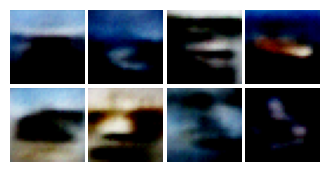

Epoch 179: 100%|██████████| 79/79 [00:03<00:00, 25.47it/s]


	[Losses] Total 2.32e+02 - Recon. 1.66e+02 - KL 66.4


Epoch 180: 100%|██████████| 79/79 [00:03<00:00, 24.34it/s]


	[Losses] Total 2.33e+02 - Recon. 1.67e+02 - KL 66.2


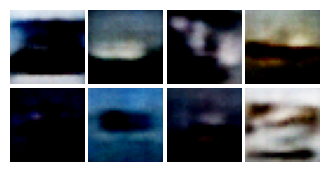

Epoch 181: 100%|██████████| 79/79 [00:03<00:00, 25.98it/s]


	[Losses] Total 2.43e+02 - Recon. 1.76e+02 - KL 66.9


Epoch 182: 100%|██████████| 79/79 [00:03<00:00, 25.84it/s]


	[Losses] Total 2.34e+02 - Recon. 1.68e+02 - KL 66.7


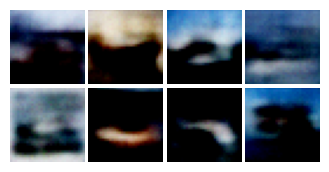

Epoch 183: 100%|██████████| 79/79 [00:03<00:00, 25.02it/s]


	[Losses] Total 2.38e+02 - Recon. 1.71e+02 - KL 66.9


Epoch 184: 100%|██████████| 79/79 [00:03<00:00, 24.26it/s]


	[Losses] Total 2.32e+02 - Recon. 1.65e+02 - KL 66.5


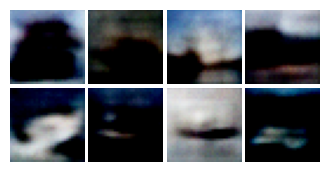

Epoch 185: 100%|██████████| 79/79 [00:03<00:00, 23.81it/s]


	[Losses] Total 2.41e+02 - Recon. 1.74e+02 - KL 66.5


Epoch 186: 100%|██████████| 79/79 [00:02<00:00, 26.51it/s]


	[Losses] Total 2.44e+02 - Recon. 1.77e+02 - KL 66.8


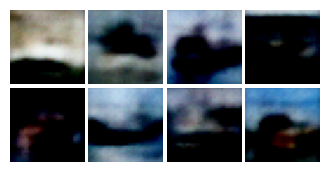

Epoch 187: 100%|██████████| 79/79 [00:03<00:00, 26.13it/s]


	[Losses] Total 2.39e+02 - Recon. 1.72e+02 - KL 66.7


Epoch 188: 100%|██████████| 79/79 [00:02<00:00, 26.42it/s]


	[Losses] Total 2.32e+02 - Recon. 1.65e+02 - KL 66.4


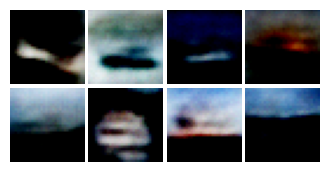

Epoch 189: 100%|██████████| 79/79 [00:03<00:00, 25.21it/s]


	[Losses] Total 2.32e+02 - Recon. 1.65e+02 - KL 66.8


Epoch 190: 100%|██████████| 79/79 [00:03<00:00, 23.83it/s]


	[Losses] Total 2.35e+02 - Recon. 1.68e+02 - KL 67.0


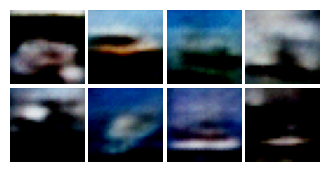

Epoch 191: 100%|██████████| 79/79 [00:03<00:00, 25.44it/s]


	[Losses] Total 2.36e+02 - Recon. 1.7e+02 - KL 66.6


Epoch 192: 100%|██████████| 79/79 [00:03<00:00, 26.21it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 66.7


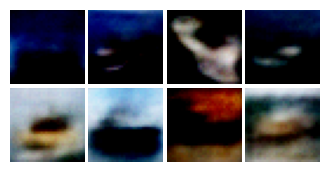

Epoch 193: 100%|██████████| 79/79 [00:03<00:00, 25.36it/s]


	[Losses] Total 2.27e+02 - Recon. 1.6e+02 - KL 67.0


Epoch 194: 100%|██████████| 79/79 [00:03<00:00, 22.47it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 67.3


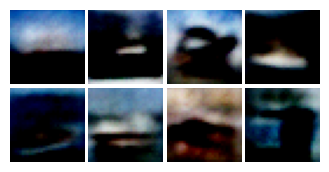

Epoch 195: 100%|██████████| 79/79 [00:03<00:00, 25.23it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 66.6


Epoch 196: 100%|██████████| 79/79 [00:02<00:00, 27.70it/s]


	[Losses] Total 2.37e+02 - Recon. 1.7e+02 - KL 67.0


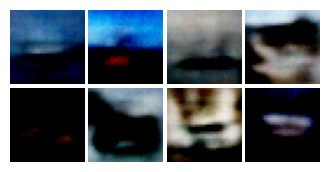

Epoch 197: 100%|██████████| 79/79 [00:02<00:00, 27.16it/s]


	[Losses] Total 2.3e+02 - Recon. 1.62e+02 - KL 67.1


Epoch 198: 100%|██████████| 79/79 [00:03<00:00, 24.92it/s]


	[Losses] Total 2.35e+02 - Recon. 1.68e+02 - KL 67.2


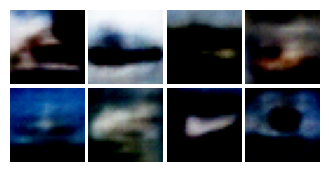

Epoch 199: 100%|██████████| 79/79 [00:03<00:00, 24.89it/s]


	[Losses] Total 2.37e+02 - Recon. 1.7e+02 - KL 67.0


Epoch 200: 100%|██████████| 79/79 [00:03<00:00, 24.86it/s]


	[Losses] Total 2.36e+02 - Recon. 1.69e+02 - KL 67.1


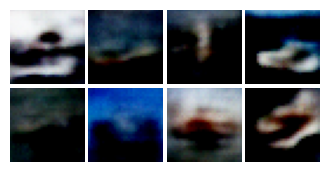

Epoch 201: 100%|██████████| 79/79 [00:02<00:00, 27.54it/s]


	[Losses] Total 2.4e+02 - Recon. 1.73e+02 - KL 67.0


Epoch 202: 100%|██████████| 79/79 [00:03<00:00, 25.56it/s]


	[Losses] Total 2.37e+02 - Recon. 1.7e+02 - KL 67.1


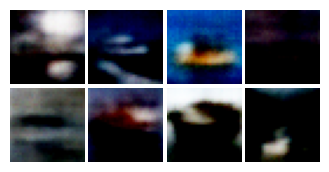

Epoch 203: 100%|██████████| 79/79 [00:03<00:00, 25.22it/s]


	[Losses] Total 2.38e+02 - Recon. 1.71e+02 - KL 67.1


Epoch 204: 100%|██████████| 79/79 [00:03<00:00, 25.15it/s]


	[Losses] Total 2.32e+02 - Recon. 1.65e+02 - KL 67.0


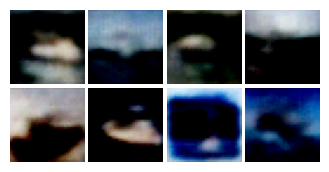

Epoch 205: 100%|██████████| 79/79 [00:03<00:00, 25.25it/s]


	[Losses] Total 2.31e+02 - Recon. 1.64e+02 - KL 66.9


Epoch 206: 100%|██████████| 79/79 [00:03<00:00, 25.73it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 67.5


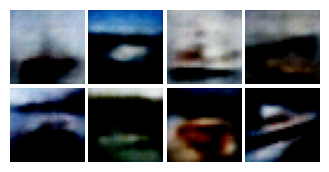

Epoch 207: 100%|██████████| 79/79 [00:02<00:00, 27.24it/s]


	[Losses] Total 2.39e+02 - Recon. 1.72e+02 - KL 67.2


Epoch 208: 100%|██████████| 79/79 [00:02<00:00, 26.77it/s]


	[Losses] Total 2.36e+02 - Recon. 1.69e+02 - KL 67.4


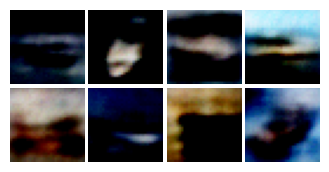

Epoch 209: 100%|██████████| 79/79 [00:03<00:00, 24.49it/s]


	[Losses] Total 2.33e+02 - Recon. 1.65e+02 - KL 67.6


Epoch 210: 100%|██████████| 79/79 [00:03<00:00, 25.26it/s]


	[Losses] Total 2.39e+02 - Recon. 1.71e+02 - KL 67.5


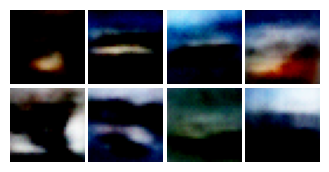

Epoch 211: 100%|██████████| 79/79 [00:02<00:00, 26.80it/s]


	[Losses] Total 2.27e+02 - Recon. 1.6e+02 - KL 67.4


Epoch 212: 100%|██████████| 79/79 [00:02<00:00, 26.46it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 67.4


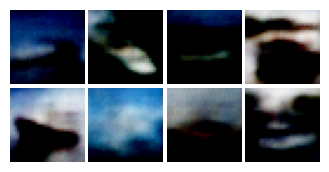

Epoch 213: 100%|██████████| 79/79 [00:03<00:00, 26.08it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 67.2


Epoch 214: 100%|██████████| 79/79 [00:03<00:00, 24.74it/s]


	[Losses] Total 2.4e+02 - Recon. 1.72e+02 - KL 67.6


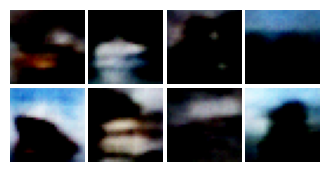

Epoch 215: 100%|██████████| 79/79 [00:03<00:00, 25.09it/s]


	[Losses] Total 2.36e+02 - Recon. 1.69e+02 - KL 67.3


Epoch 216: 100%|██████████| 79/79 [00:02<00:00, 26.85it/s]


	[Losses] Total 2.26e+02 - Recon. 1.59e+02 - KL 67.4


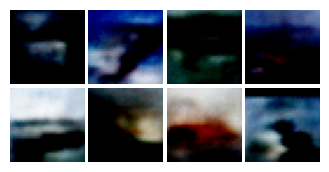

Epoch 217: 100%|██████████| 79/79 [00:03<00:00, 26.21it/s]


	[Losses] Total 2.31e+02 - Recon. 1.64e+02 - KL 67.1


Epoch 218: 100%|██████████| 79/79 [00:03<00:00, 24.78it/s]


	[Losses] Total 2.33e+02 - Recon. 1.66e+02 - KL 67.3


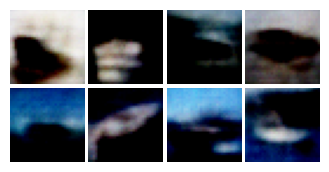

Epoch 219: 100%|██████████| 79/79 [00:03<00:00, 25.01it/s]


	[Losses] Total 2.38e+02 - Recon. 1.7e+02 - KL 67.6


Epoch 220: 100%|██████████| 79/79 [00:03<00:00, 25.10it/s]


	[Losses] Total 2.33e+02 - Recon. 1.65e+02 - KL 67.5


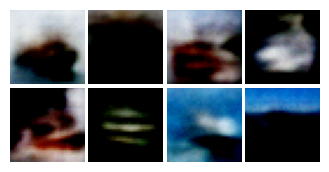

Epoch 221: 100%|██████████| 79/79 [00:02<00:00, 26.80it/s]


	[Losses] Total 2.26e+02 - Recon. 1.58e+02 - KL 67.7


Epoch 222: 100%|██████████| 79/79 [00:03<00:00, 25.51it/s]


	[Losses] Total 2.32e+02 - Recon. 1.65e+02 - KL 67.5


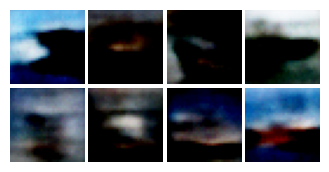

Epoch 223: 100%|██████████| 79/79 [00:03<00:00, 25.77it/s]


	[Losses] Total 2.37e+02 - Recon. 1.69e+02 - KL 67.7


Epoch 224: 100%|██████████| 79/79 [00:03<00:00, 24.01it/s]


	[Losses] Total 2.3e+02 - Recon. 1.63e+02 - KL 67.7


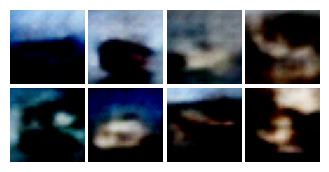

Epoch 225: 100%|██████████| 79/79 [00:03<00:00, 25.01it/s]


	[Losses] Total 2.25e+02 - Recon. 1.57e+02 - KL 67.8


Epoch 226: 100%|██████████| 79/79 [00:03<00:00, 25.29it/s]


	[Losses] Total 2.28e+02 - Recon. 1.6e+02 - KL 67.6


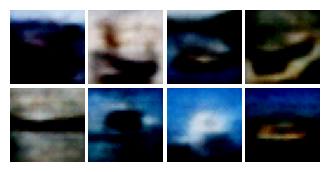

Epoch 227: 100%|██████████| 79/79 [00:03<00:00, 26.25it/s]


	[Losses] Total 2.29e+02 - Recon. 1.61e+02 - KL 67.4


Epoch 228: 100%|██████████| 79/79 [00:03<00:00, 25.90it/s]


	[Losses] Total 2.3e+02 - Recon. 1.62e+02 - KL 67.7


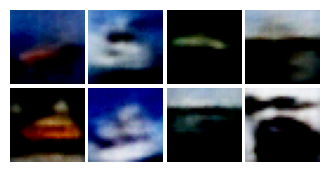

Epoch 229: 100%|██████████| 79/79 [00:03<00:00, 24.82it/s]


	[Losses] Total 2.35e+02 - Recon. 1.67e+02 - KL 67.6


Epoch 230: 100%|██████████| 79/79 [00:03<00:00, 25.83it/s]


	[Losses] Total 2.39e+02 - Recon. 1.71e+02 - KL 67.9


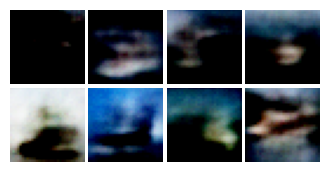

Epoch 231: 100%|██████████| 79/79 [00:03<00:00, 26.03it/s]


	[Losses] Total 2.37e+02 - Recon. 1.69e+02 - KL 68.1


Epoch 232: 100%|██████████| 79/79 [00:02<00:00, 26.49it/s]


	[Losses] Total 2.24e+02 - Recon. 1.57e+02 - KL 67.8


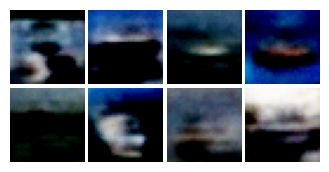

Epoch 233: 100%|██████████| 79/79 [00:03<00:00, 25.38it/s]


	[Losses] Total 2.25e+02 - Recon. 1.57e+02 - KL 67.4


Epoch 234: 100%|██████████| 79/79 [00:03<00:00, 23.94it/s]


	[Losses] Total 2.4e+02 - Recon. 1.72e+02 - KL 68.2


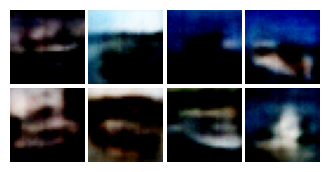

Epoch 235: 100%|██████████| 79/79 [00:02<00:00, 26.37it/s]


	[Losses] Total 2.3e+02 - Recon. 1.62e+02 - KL 67.9


Epoch 236: 100%|██████████| 79/79 [00:02<00:00, 27.25it/s]


	[Losses] Total 2.26e+02 - Recon. 1.58e+02 - KL 68.1


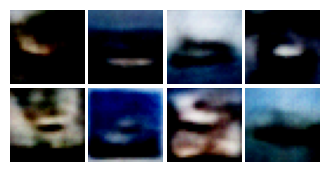

Epoch 237: 100%|██████████| 79/79 [00:02<00:00, 27.43it/s]


	[Losses] Total 2.27e+02 - Recon. 1.59e+02 - KL 67.8


Epoch 238: 100%|██████████| 79/79 [00:03<00:00, 24.40it/s]


	[Losses] Total 2.24e+02 - Recon. 1.56e+02 - KL 68.0


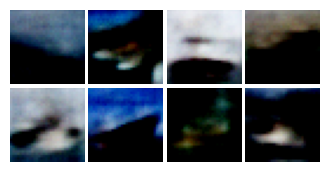

Epoch 239: 100%|██████████| 79/79 [00:03<00:00, 24.03it/s]


	[Losses] Total 2.26e+02 - Recon. 1.58e+02 - KL 67.9


Epoch 240: 100%|██████████| 79/79 [00:02<00:00, 26.68it/s]


	[Losses] Total 2.32e+02 - Recon. 1.64e+02 - KL 67.8


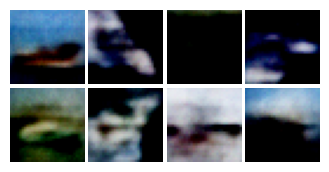

Epoch 241: 100%|██████████| 79/79 [00:02<00:00, 27.00it/s]


	[Losses] Total 2.38e+02 - Recon. 1.7e+02 - KL 68.2


Epoch 242: 100%|██████████| 79/79 [00:02<00:00, 26.52it/s]


	[Losses] Total 2.35e+02 - Recon. 1.67e+02 - KL 68.0


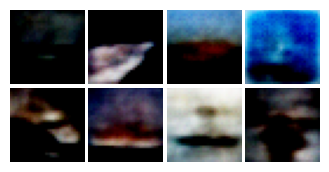

Epoch 243: 100%|██████████| 79/79 [00:03<00:00, 26.23it/s]


	[Losses] Total 2.31e+02 - Recon. 1.63e+02 - KL 68.0


Epoch 244: 100%|██████████| 79/79 [00:03<00:00, 26.12it/s]


	[Losses] Total 2.26e+02 - Recon. 1.58e+02 - KL 67.9


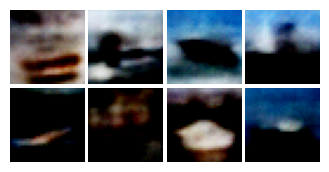

Epoch 245: 100%|██████████| 79/79 [00:02<00:00, 26.57it/s]


	[Losses] Total 2.3e+02 - Recon. 1.62e+02 - KL 68.1


Epoch 246: 100%|██████████| 79/79 [00:03<00:00, 25.76it/s]


	[Losses] Total 2.21e+02 - Recon. 1.53e+02 - KL 67.8


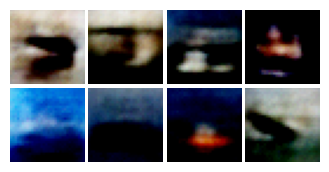

Epoch 247: 100%|██████████| 79/79 [00:03<00:00, 26.19it/s]


	[Losses] Total 2.27e+02 - Recon. 1.59e+02 - KL 67.8


Epoch 248: 100%|██████████| 79/79 [00:03<00:00, 24.97it/s]


	[Losses] Total 2.26e+02 - Recon. 1.58e+02 - KL 67.2


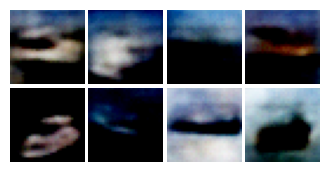

Epoch 249: 100%|██████████| 79/79 [00:03<00:00, 24.91it/s]

	[Losses] Total 2.22e+02 - Recon. 1.54e+02 - KL 67.9
Done.


<Figure size 640x480 with 0 Axes>

In [ ]:
p.train()
q.train()
reparam.train()

parameters = list(p.parameters()) + list(q.parameters())
optim = torch.optim.Adam(parameters, lr=learning_rate, betas=(0.5, 0.999))
# bce = nn.BCELoss(size_average=False, reduction='mean')
mse_loss = nn.MSELoss(reduction='sum')



total_losses = []
recon_losses = []
kl_losses = []
current_image = 0

print('Training...')
for epoch in range(max_epochs):

  avg_total_loss = 0
  avg_recon_loss = 0
  avg_kl_loss = 0

  for _, (batch, _) in enumerate(tqdm(trainloader, desc=f"Epoch {epoch}")):

    # print("Batch shape:", batch.shape)
    # break
    batch = batch.to(device) # load the data onto GPU is relevant
    # batch = batch.view(batch_size, -1)



    # forward
    z_mu, z_var = q(batch)
    z = reparam(z_mu, z_var)
    # print("z size after reparametrization:", z.size())  # Add this line to check the size
    batch_recon = p(z)

    # reconstruction loss E[log P(X|z)]
    # recon_loss = bce(batch_recon, batch) / len(batch)
    recon_loss = mse_loss(batch_recon, batch) / len(batch)
    # distribution loss D_KL(Q(z|X) || P(z))
    kl_loss = torch.mean(0.5 * torch.sum(torch.exp(z_var) + z_mu ** 2 - 1. - z_var, 1))
    # Total loss
    total_loss = recon_loss + kl_loss

    # backward
    total_loss.backward()

    # update
    optim.step()

    # housekeeping
    optim.zero_grad()
    avg_total_loss += total_loss / len(batch)
    avg_recon_loss += recon_loss / len(batch)
    avg_kl_loss += kl_loss / len(batch)

  # end of epoch
  total_losses.append(avg_total_loss.item())
  recon_losses.append(avg_recon_loss.item())
  kl_losses.append(avg_kl_loss.item())
  print(f"\t[Losses] Total {total_losses[-1]:.3} - Recon. {recon_losses[-1]:.3} - KL {kl_losses[-1]:.3}")

  # plot
  if epoch % 2 == 0:
        samples = p(z).data.cpu().numpy()[:16]

        plt.close()
        fig = plt.figure(figsize=(4, 4))
        gs = gridspec.GridSpec(4, 4)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(3, 32, 32).transpose(1, 2, 0))

        if not os.path.exists('training/'):
            os.makedirs('training/')
        plt.show()
        # plt.pause(0.1)
        plt.savefig('training/{}_{}.png'.format(epoch, str(current_image).zfill(3)), bbox_inches='tight')
        current_image += 1
        # plt.close(fig)

print("Done.")

We can now plot the training curves.

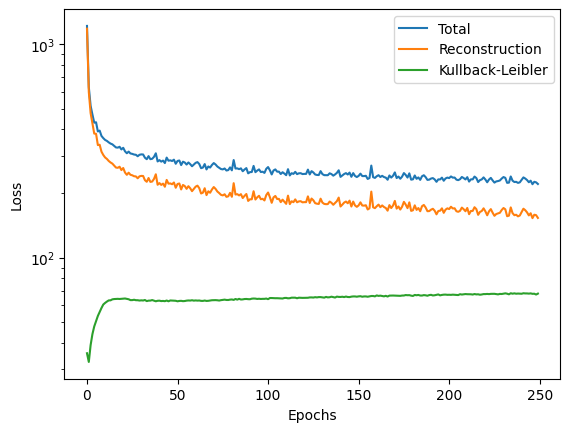

In [ ]:
plt.ion()

fig = plt.figure()
plt.semilogy(total_losses, label='Total')
plt.semilogy(recon_losses, label='Reconstruction')
plt.semilogy(kl_losses, label='Kullback-Leibler')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Generation
----------

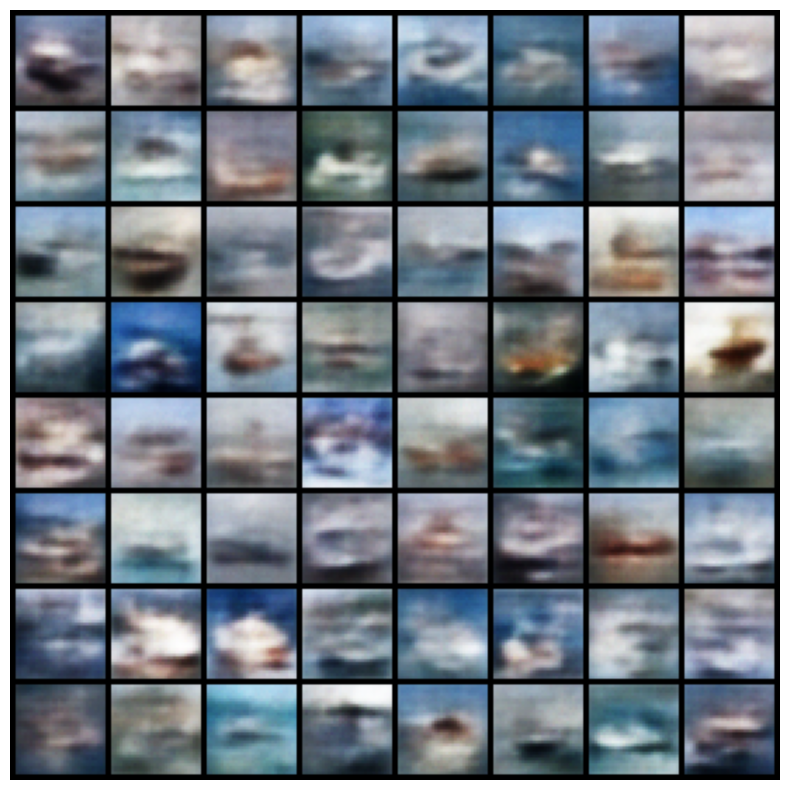

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# plt.ion()

# import torchvision.utils

# p.eval()
# n = 8

# def show_image(img):
#     npimg = img.numpy()
#     plt.imshow(np.transpose(npimg, (1, 2, 0)))

# def correct_shape(imgs):
#   return imgs.view(n**2, 28, 28).unsqueeze(1)

# with torch.no_grad():
#     # sample latent vectors from the standard normal distribution
#     latent = torch.randn((n**2, latent_dim), device=device)
#     fake_image_batch = p(latent)
#     fake_image_batch = correct_shape(fake_image_batch)
#     fake_image_batch = fake_image_batch.cpu()


#     fig, ax = plt.subplots(figsize=(10, 10))
#     show_image(torchvision.utils.make_grid(fake_image_batch.data,nrow=n))
#     plt.axis('off')
#     plt.show()

import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.utils

plt.ion()

p.eval()
n = 8  # Number of images per row/column in the grid

def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

with torch.no_grad():
    # Sample latent vectors from the standard normal distribution
    latent = torch.randn((n**2, latent_dim), device=device)
    fake_image_batch = p(latent)
    fake_image_batch = fake_image_batch.cpu()

    fig, ax = plt.subplots(figsize=(10, 10))
    show_image(torchvision.utils.make_grid(fake_image_batch.data, nrow=n, normalize=True))
    plt.axis('off')
    plt.show()


Visualization in Latent Space
-----------------------------

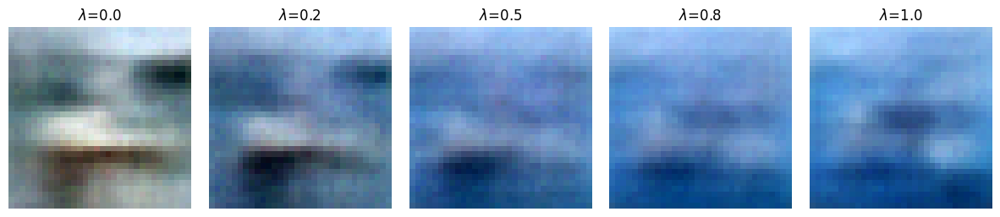

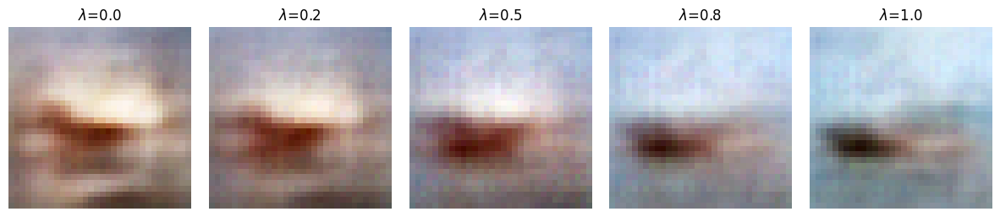

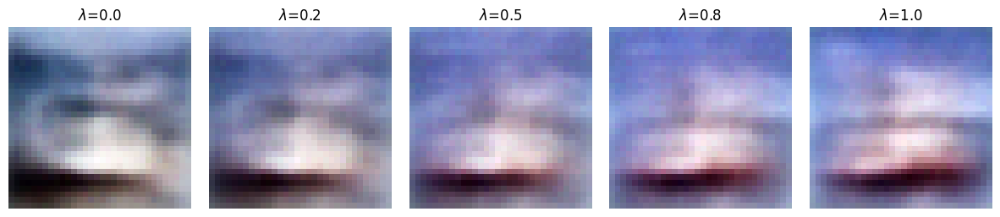

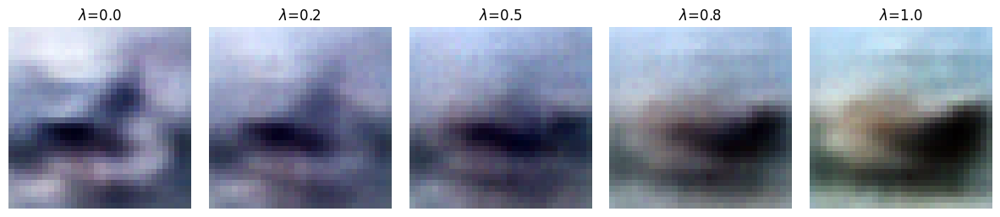

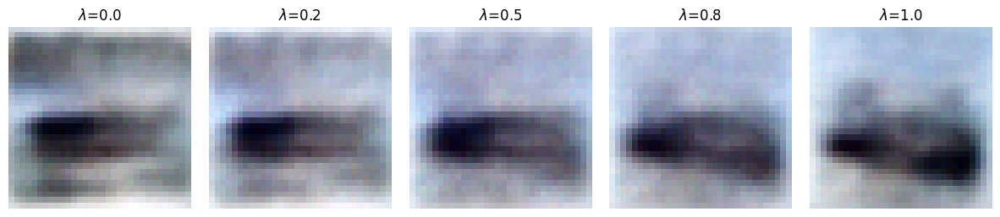

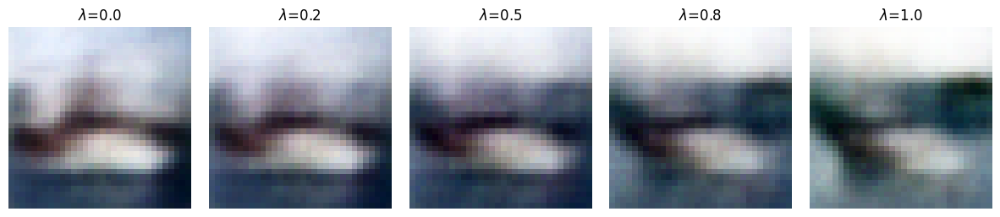

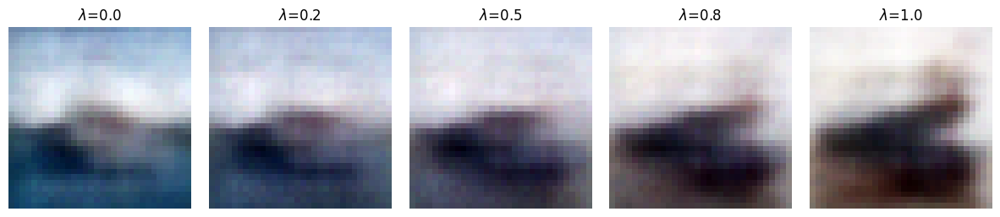

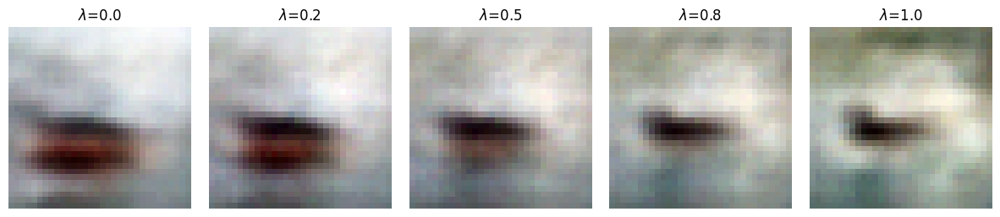

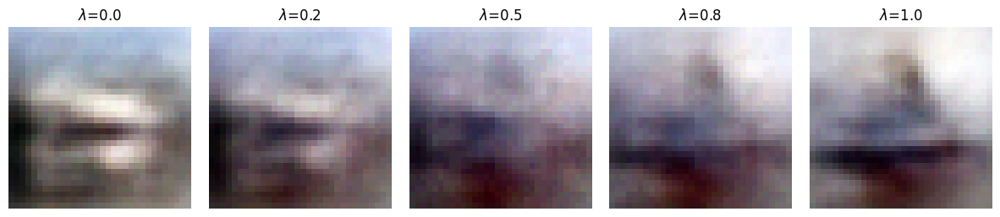

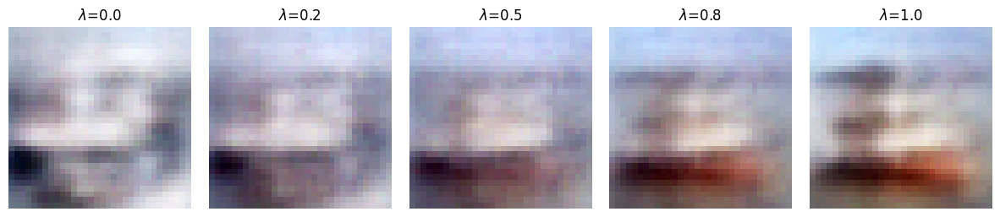

In [ ]:
  # import numpy as np
  # import matplotlib.pyplot as plt
  # plt.ion()

  # import torchvision.utils

  # p.eval()

  # def correct_shape(imgs):
  #   return imgs.view(-1, 28, 28).unsqueeze(1)

  # def interpolation(lambda1, model, latent_1, latent_2):

  #     with torch.no_grad():

  #         # interpolation of the two latent vectors
  #         inter_latent = lambda1* latent_1 + (1- lambda1) * latent_2

  #         # reconstruct interpolated image
  #         inter_latent = inter_latent.to(device)
  #         inter_image = model(inter_latent)
  #         inter_image = inter_image.cpu()

  #         return inter_image

  # # sample two latent vectors from the standard normal distribution
  # latent_1 = torch.randn((1, latent_dim), device=device)
  # latent_2 = torch.randn((1, latent_dim), device=device)

  # # interpolation lambdas
  # lambda_range=np.linspace(0,1,5)

  # fig, axs = plt.subplots(1,5, figsize=(15, 3))
  # fig.subplots_adjust(wspace=.1)
  # axs = axs.ravel()

  # for ind,l in enumerate(lambda_range):
  #     inter_image=interpolation(float(l), p, latent_1, latent_2)

  #     inter_image = correct_shape(inter_image)

  #     image = inter_image.numpy()

  #     axs[ind].imshow(image[0,0,:,:], cmap='gray')
  #     axs[ind].set_title('$\lambda$='+str(round(l,1)))
  #     axs[ind].axis('off')
  # plt.show()

import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.utils

def interpolation(lambda1, model, latent_1, latent_2):
    with torch.no_grad():
        # Interpolation of the two latent vectors
        inter_latent = lambda1 * latent_1 + (1 - lambda1) * latent_2

        # Reconstruct interpolated image
        inter_latent = inter_latent.to(device)
        inter_image = model(inter_latent)
        inter_image = inter_image.cpu()

        return inter_image


for i in range(10):
    plt.ion()

    p.eval()



    # Sample two latent vectors from the standard normal distribution
    latent_1 = torch.randn((1, latent_dim), device=device)
    latent_2 = torch.randn((1, latent_dim), device=device)

    # Interpolation lambdas
    lambda_range = np.linspace(0, 1, 5)

    fig, axs = plt.subplots(1, 5, figsize=(15, 3))
    fig.subplots_adjust(wspace=.1)
    axs = axs.ravel()

    for ind, l in enumerate(lambda_range):
        inter_image = interpolation(float(l), p, latent_1, latent_2)

        # Convert image for display
        image = inter_image.numpy()
        image = np.transpose(image[0], (1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
        image = (image - image.min()) / (image.max() - image.min())  # Normalize to [0, 1]

        axs[ind].imshow(image)
        axs[ind].set_title('$\lambda$=' + str(round(l, 1)))
        axs[ind].axis('off')

    plt.show()
